# Perform compound diversity analysis on NEK datasets
- I am using AMPL functions to perform compound diversity analysis on NEK datasets
- I will use the Tanimoto distance to calculate the diversity of the compounds
- I will use UMAP to visualize the diversity of the compounds
- I am using the original NEK2 binding dataset with original MOE features as an example - with Yaru's original 5-fold imbalanced split from the NEK_data_4Berkeley folder

In [119]:
import pandas as pd
import numpy as np
import seaborn as sns
from atomsci.ddm.pipeline import diversity_plots as dp
colors = ["#6EC8BE","#BE2369","#FFC30F","#694691","#EB1E23","#7682A4","#373C50","#A7DDD8",]
sns.set_palette(sns.color_palette(colors))

## Load the data and concatenate test sets

In [120]:
og_datapath = '/Users/jayceepang/msse/capstone/data/NEK_ATOM_data/'
nek2=pd.read_csv(f'{og_datapath}NEK2/NEK2_1_uM_min_50_pct_binding_5fold_random_imbalanced.csv')
nek2['subset']=np.where(nek2.fold=='fold1','test','train')
nek2.shape


(1408, 311)

In [121]:
nek2.head()

,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,vsurf_Wp4,vsurf_Wp5,vsurf_Wp6,vsurf_Wp7,vsurf_Wp8,weinerPath,weinerPol_per_atom,zagreb_per_atom,fold,subset
0,kdb_2562,Cn1cnc2c(N)ncnc21,0,14.897949,53.326256,8.903966,161.21796,17.860519,-2.222484,-0.418766,...,30.125,12.500,3.750,0.250,0.0,137,0.833333,3.222222,fold4,train
1,kdb_2536,FC(F)(F)c1ccc(/C=C/c2cncnc2Nc2ccc3[nH]c(Cc4ccc...,0,6.511466,299.143010,8.385662,196.06219,11.950429,-2.311277,-0.649332,...,30.125,12.250,2.875,0.000,0.0,4495,0.945455,3.418182,fold1,test
2,kdb_3056,CNCc1ccc(-c2cc(-c3nc(-c4ccc(S(=O)(=O)C(C)C)cc4...,0,8.496225,275.100830,8.517174,278.04828,13.229856,-2.568112,-0.618748,...,54.000,20.250,4.625,0.125,0.0,3645,0.932203,2.983051,fold2,train
3,kdb_3510,CNC(=O)Nc1ccc2c(c1)CC[C@@]21OC(=O)N(CC(=O)N(Cc...,0,6.791036,344.713500,8.136228,261.31158,12.350931,-2.586196,-0.562002,...,27.125,10.625,2.500,0.000,0.0,4847,1.064516,3.322581,fold4,train
4,kdb_3024,CCCNc1ccc2ncc(-c3ccnc(C)c3)n2n1,0,9.173611,133.466250,9.677048,114.33565,12.685881,-2.513905,-0.540779,...,22.875,7.500,0.750,0.000,0.0,828,0.763158,2.736842,fold1,test


In [122]:
# get holdout test set
holdout_datapath = '//Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/holdout_test/holdout_test_set_from_new_literature_data/scaled_descriptors/'
test=pd.read_csv(f'{holdout_datapath}NEK2_1_uM_min_50_pct_binding_2024_with_moe_descriptors.csv')
test['subset']='lit_test'
print(test.shape)
test=test[~test.base_rdkit_smiles.isin(nek2.base_rdkit_smiles)]
print(test.shape)
test.head()

(1999, 310)
(591, 310)


,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,vsurf_Wp3,vsurf_Wp4,vsurf_Wp5,vsurf_Wp6,vsurf_Wp7,vsurf_Wp8,weinerPath,weinerPol_per_atom,zagreb_per_atom,subset
1,kdb_3287,CNC(=O)c1cncc(/C=C/c2c(C)cccc2C)c1,0,9.323538,176.38103,11.648866,88.018578,13.965144,-2.358680,-0.539653,...,80.875,13.250,4.625,0.875,0.000,0.0,883,0.763158,2.578947,lit_test
5,kdb_4046,N#Cc1ccc(C(=O)c2cnn(-c3ccc(F)cc3)c2N)cc1,0,7.879416,267.06171,10.876716,165.153520,15.734172,-2.215215,-0.644355,...,114.250,25.750,10.250,3.625,0.250,0.0,1270,1.058824,3.529412,lit_test
9,kdb_3392,CC1=C(C(=O)Nc2ccc3[nH]nc(C)c3c2)C(c2ccc(C(F)(F...,0,5.716096,292.66962,6.396969,261.896180,11.634893,-2.549502,-0.615016,...,174.250,51.375,20.125,5.000,0.125,0.0,2752,1.040000,3.400000,lit_test
10,kdb_3194,COc1cc2ncn(-c3cc(OCc4ccccc4Cl)c(C(N)=O)s3)c2cc1OC,0,8.723108,288.17365,11.927455,134.365040,14.726725,-2.314566,-0.613964,...,134.875,16.750,5.500,1.625,0.250,0.0,2562,1.020833,3.333333,lit_test
14,kdb_3297,Fc1cccc(COc2ccc(Nc3ncnc4sc(-c5cccs5)cc34)cc2Cl)c1,0,7.161835,264.26260,10.443479,125.865940,13.179695,-2.331277,-0.659439,...,98.750,21.625,9.875,3.375,0.000,0.0,3108,1.000000,3.652174,lit_test


In [123]:
# concatenate the test set to the training set
nek2=pd.concat([nek2,test]).reset_index(drop=True) # make sure you don't have duplicate indices before merge operations later
nek2.subset.value_counts()

subset
train       1125
lit_test     591
test         283
Name: count, dtype: int64

In [95]:
nek2

,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,vsurf_Wp4,vsurf_Wp5,vsurf_Wp6,vsurf_Wp7,vsurf_Wp8,weinerPath,weinerPol_per_atom,zagreb_per_atom,fold,subset
0,kdb_2562,Cn1cnc2c(N)ncnc21,0,14.897949,53.326256,8.903966,161.21796,17.860519,-2.222484,-0.418766,...,30.125,12.500,3.750,0.250,0.0,137,0.833333,3.222222,fold4,train
1,kdb_2536,FC(F)(F)c1ccc(/C=C/c2cncnc2Nc2ccc3[nH]c(Cc4ccc...,0,6.511466,299.143010,8.385662,196.06219,11.950429,-2.311277,-0.649332,...,30.125,12.250,2.875,0.000,0.0,4495,0.945455,3.418182,fold1,test
2,kdb_3056,CNCc1ccc(-c2cc(-c3nc(-c4ccc(S(=O)(=O)C(C)C)cc4...,0,8.496225,275.100830,8.517174,278.04828,13.229856,-2.568112,-0.618748,...,54.000,20.250,4.625,0.125,0.0,3645,0.932203,2.983051,fold2,train
3,kdb_3510,CNC(=O)Nc1ccc2c(c1)CC[C@@]21OC(=O)N(CC(=O)N(Cc...,0,6.791036,344.713500,8.136228,261.31158,12.350931,-2.586196,-0.562002,...,27.125,10.625,2.500,0.000,0.0,4847,1.064516,3.322581,fold4,train
4,kdb_3024,CCCNc1ccc2ncc(-c3ccnc(C)c3)n2n1,0,9.173611,133.466250,9.677048,114.33565,12.685881,-2.513905,-0.540779,...,22.875,7.500,0.750,0.000,0.0,828,0.763158,2.736842,fold1,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,kdb_4039,CN1CCN(c2ccc(Nc3nc(N)c(C(=O)c4ccc5c(c4)OCCO5)s...,0,9.116434,197.857010,9.138695,196.56590,12.527763,-2.771898,-0.625091,...,52.750,20.500,5.625,0.500,0.0,3435,0.879310,3.000000,NaN,lit_test
1995,kdb_3219,FC(F)(F)c1cccc(Nc2nccc(-c3cnn4nc(-c5ccccc5)ccc...,0,6.778831,325.226620,9.960423,175.69174,13.698546,-2.270249,-0.626298,...,15.875,7.250,1.875,0.000,0.0,3269,1.085106,3.744681,NaN,lit_test
1996,kdb_4174,CN(C)CCOc1ccc(-c2nc(-c3ccc4c(c3)CC/C4=N/O)c(-c...,0,8.268928,222.873230,9.171212,166.93161,11.863657,-2.650380,-0.577109,...,26.375,10.125,2.875,0.250,0.0,3750,0.854839,2.935484,NaN,lit_test
1997,kdb_3132,NS(=O)(=O)c1ccc(N/N=C2\C(=O)Nc3cccc(CCc4ccncc4...,0,8.178218,242.953810,8.480814,228.12656,13.136458,-2.463643,-0.623328,...,77.875,33.625,11.500,1.375,0.0,2731,0.938776,3.265306,NaN,lit_test


<Axes: xlabel='ASA-', ylabel='Count'>

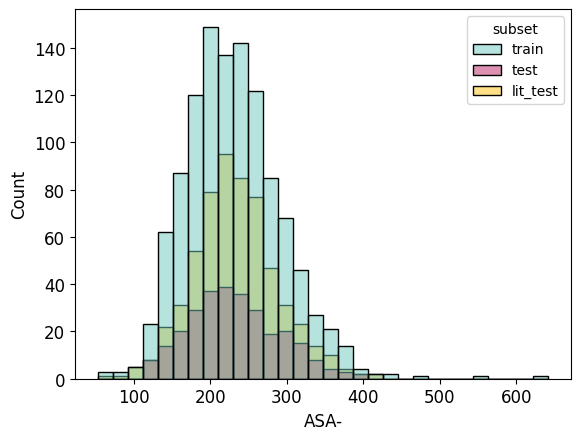

In [96]:
# make sure the data makes sense - plot histograms of the features
sns.histplot(nek2, x='ASA-', hue='subset', bins=30)

<Axes: xlabel='vsurf_Wp6', ylabel='Count'>

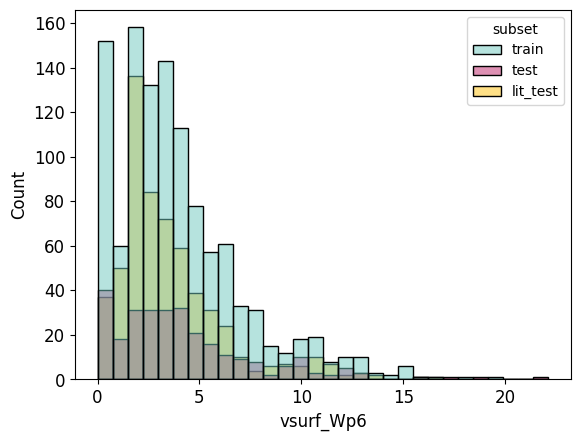

In [97]:
sns.histplot(nek2, x='vsurf_Wp6', hue='subset', bins=30)

Yes - the features are on the same scale in the different subsets

## Plot the distribution of Tanimoto distances of the test sets to the training dataset

/Users/jayceepang/msse/capstone/repos/AMPL/atomsci/ddm/pipeline/diversity_plots.py:152: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dists=pd.concat([dists,diststmp])


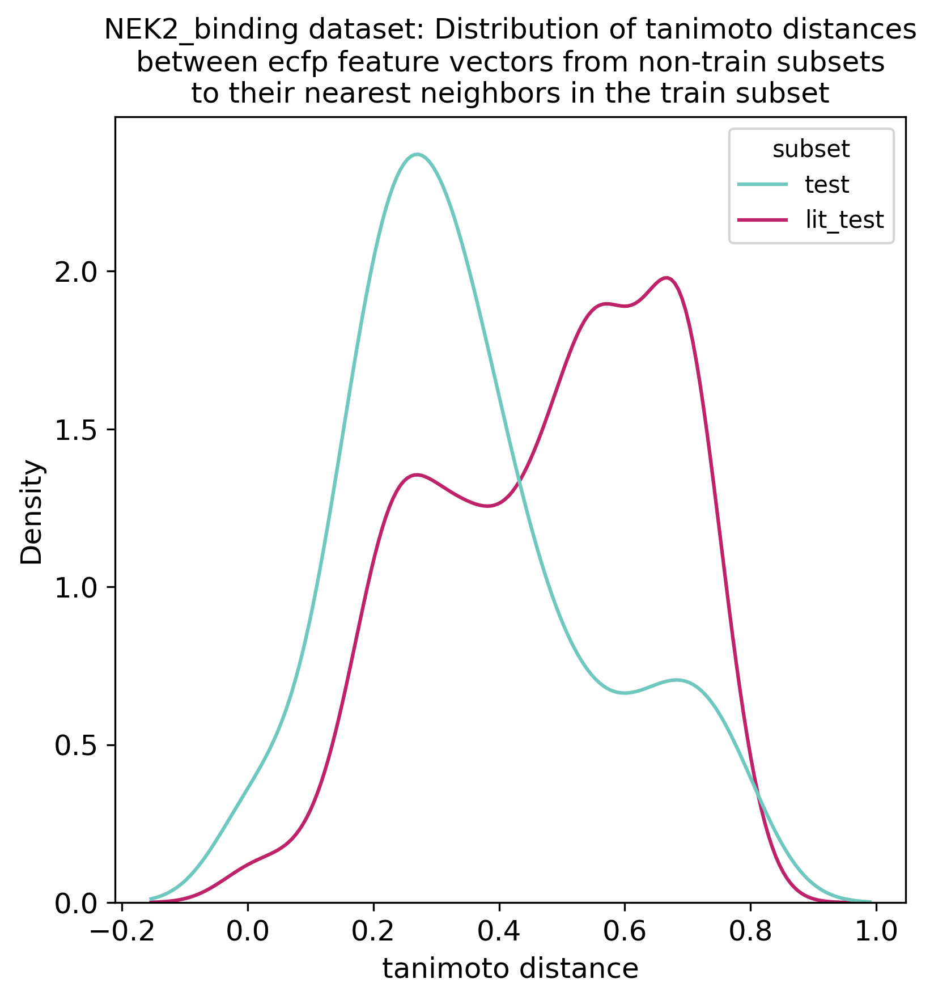

In [98]:
# Plot the distribution of Tanimoto distances
# this function only needs a dataframe with SMILES and the subset column
dists=dp.plot_tani_dist_distr(nek2, 'base_rdkit_smiles', 'NEK2_binding', radius=2, subsets=True)

There are more compounds in the lit_test further away from the training set than in the original test set, as we expected. These compounds will probably be harder to predict on.

### Do the same for SMOTE data (take apart function)

In [128]:
# generate ECFP fingerprints for the full dataset
from rdkit.Chem import AllChem
from rdkit.Chem import rdFingerprintGenerator
mols2 = [AllChem.MolFromSmiles(s) for s in nek2.base_rdkit_smiles]

morgan_gen = rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=1024)
nek2_fprints = [morgan_gen.GetFingerprint(mol) for mol in mols2]
nek2_fprints_df=pd.DataFrame(np.array(nek2_fprints), columns=['ecfp2_1024_%d' % x for x in range(1024)], index=nek2.index)
print(nek2.shape)
nek2=nek2.join(nek2_fprints_df)
print(nek2.shape)
nek2.head()

(1999, 311)
(1999, 1335)


,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,ecfp2_1024_1014,ecfp2_1024_1015,ecfp2_1024_1016,ecfp2_1024_1017,ecfp2_1024_1018,ecfp2_1024_1019,ecfp2_1024_1020,ecfp2_1024_1021,ecfp2_1024_1022,ecfp2_1024_1023
0,kdb_2562,Cn1cnc2c(N)ncnc21,0,14.897949,53.326256,8.903966,161.21796,17.860519,-2.222484,-0.418766,...,0,0,0,0,0,0,0,0,0,0
1,kdb_2536,FC(F)(F)c1ccc(/C=C/c2cncnc2Nc2ccc3[nH]c(Cc4ccc...,0,6.511466,299.143010,8.385662,196.06219,11.950429,-2.311277,-0.649332,...,0,0,0,0,0,0,0,0,0,0
2,kdb_3056,CNCc1ccc(-c2cc(-c3nc(-c4ccc(S(=O)(=O)C(C)C)cc4...,0,8.496225,275.100830,8.517174,278.04828,13.229856,-2.568112,-0.618748,...,0,0,0,0,0,0,0,0,0,0
3,kdb_3510,CNC(=O)Nc1ccc2c(c1)CC[C@@]21OC(=O)N(CC(=O)N(Cc...,0,6.791036,344.713500,8.136228,261.31158,12.350931,-2.586196,-0.562002,...,0,0,0,0,0,0,0,0,0,0
4,kdb_3024,CCCNc1ccc2ncc(-c3ccnc(C)c3)n2n1,0,9.173611,133.466250,9.677048,114.33565,12.685881,-2.513905,-0.540779,...,0,0,0,0,0,0,0,0,0,0


In [129]:
# do SMOTE on FP's and add to NEK2 df
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
train_x_df_temp=nek2[['ecfp2_1024_%d' % x for x in range(1024)]][nek2.subset=='train']
train_y_df_temp=nek2[['active']][nek2.subset=='train']
new_train_x_df, new_train_y_df = oversample.fit_resample(train_x_df_temp, train_y_df_temp)

new_train_x_df=new_train_x_df.iloc[len(train_x_df_temp):].copy()
new_train_y_df=new_train_y_df.iloc[len(train_x_df_temp):].copy()

new_train_x_df['subset']='smote'
new_train_x_df['compound_id']=[f'smote_{x}' for x in range(len(new_train_x_df))]
new_train_x_df['active']=new_train_y_df
print(nek2.shape)
nek2=pd.concat([nek2,new_train_x_df]).reset_index(drop=True)
nek2.shape

(1999, 1335)


(3034, 1335)

In [130]:
nek2.subset.value_counts()

subset
train       1125
smote       1035
lit_test     591
test         283
Name: count, dtype: int64

In [131]:
# save nek2 dataframe with all features and ECFP-SMOTE compounds
nek2.to_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv', index=False)

In [132]:
nek2 = pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')
nek2

/var/folders/wb/cvnnx9qn3tj18cq5_9wx39xm0000gn/T/ipykernel_87443/3329604226.py:1: DtypeWarning: Columns (1,309) have mixed types. Specify dtype option on import or set low_memory=False.
  nek2 = pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')


,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,ecfp2_1024_1014,ecfp2_1024_1015,ecfp2_1024_1016,ecfp2_1024_1017,ecfp2_1024_1018,ecfp2_1024_1019,ecfp2_1024_1020,ecfp2_1024_1021,ecfp2_1024_1022,ecfp2_1024_1023
0,kdb_2562,Cn1cnc2c(N)ncnc21,0,14.897949,53.326256,8.903966,161.21796,17.860519,-2.222484,-0.418766,...,0,0,0,0,0,0,0,0,0,0
1,kdb_2536,FC(F)(F)c1ccc(/C=C/c2cncnc2Nc2ccc3[nH]c(Cc4ccc...,0,6.511466,299.143010,8.385662,196.06219,11.950429,-2.311277,-0.649332,...,0,0,0,0,0,0,0,0,0,0
2,kdb_3056,CNCc1ccc(-c2cc(-c3nc(-c4ccc(S(=O)(=O)C(C)C)cc4...,0,8.496225,275.100830,8.517174,278.04828,13.229856,-2.568112,-0.618748,...,0,0,0,0,0,0,0,0,0,0
3,kdb_3510,CNC(=O)Nc1ccc2c(c1)CC[C@@]21OC(=O)N(CC(=O)N(Cc...,0,6.791036,344.713500,8.136228,261.31158,12.350931,-2.586196,-0.562002,...,0,0,0,0,0,0,0,0,0,0
4,kdb_3024,CCCNc1ccc2ncc(-c3ccnc(C)c3)n2n1,0,9.173611,133.466250,9.677048,114.33565,12.685881,-2.513905,-0.540779,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3029,smote_1030,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3030,smote_1031,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
3031,smote_1032,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3032,smote_1033,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


### Plot the distribution of Tanimoto distances of the SMOTE compounds to the training dataset

In [114]:
# method to translate ecfp fingerprints in DF back to bitvectors
from rdkit.DataStructs import ExplicitBitVect
def df_to_bitvect(df):
    bitvects = []
    for _, row in df.iterrows():
        bit_string = ''.join(row.astype(str))
        bitvect = ExplicitBitVect(len(bit_string))
        for i, bit in enumerate(bit_string):
            if bit == '1':
                bitvect.SetBit(i)
        bitvects.append(bitvect)
    return bitvects

In [115]:
from atomsci.ddm.pipeline import chem_diversity as cd
from atomsci.ddm.pipeline import dist_metrics
import logging
import pandas as pd
import matplotlib.pyplot as plt

def plot_tani_dist_distr(df, smiles_col, df_name, radius=2, featurized=False, subset_col='subset', subsets=False, ref_subset='train', plot_width=6, ndist_max=None, **metric_kwargs):
    """Generate a density plot showing the distribution of nearest neighbor distances between
    ecfp feature vectors, using the Tanimoto metric. Optionally split by subset.
    Args:
        df (DataFrame): A data frame containing, at minimum, a column of SMILES strings.
        smiles_col (str): Name of the column containing SMILES strings.
        df_name (str): Name for the dataset, to be used in the plot title.
        radius (int): Radius parameter used to calculate ECFP fingerprints. The default is 2, meaning that ECFP4 fingerprints are calculated.
        featurized (bool): If True, the input data frame contains precomputed features. If False, features are calculated on the fly.
        subset_col (str): Name of the column containing subset names.
        subsets (bool): If True, distances are only calculated for compounds not in the reference subset, and the distances computed are to the nearest neighbors in the reference subset.
        ref_subset (str): Reference subset for nearest-neighbor distances, if `subsets` is True.
        plot_width (float): Plot width in inches.
        ndist_max (int): Not used, included only for backward compatibility.
        metric_kwargs: Additional arguments to pass to metric. Not used, included only for backward compatibility.
    Returns:
        dist (DataFrame): Table of individual nearest-neighbor Tanimoto distance values. If subsets is True,
        the table will include a column indicating the subset each compound belongs to.
    """
    log = logging.getLogger('ATOM')
    
    num_cmpds = len(df)
    if num_cmpds > 50000:
        log.warning("Dataset has %d compounds, too big to calculate distance matrix" % num_cmpds)
        return

    if subsets and subset_col not in df.columns:
        log.warning(f"{subset_col} column not found. Calculating total tanimoto distances instead.")
        subsets=False
    feat_type = 'ecfp'
    dist_metric = 'tanimoto'
    calc_type='nearest'
    num_nearest=1
    if not subsets:
        smiles_arr1 = df[smiles_col].values
        if not featurized:
            dists=cd.calc_dist_smiles(feat_type, dist_metric, smiles_arr1, calc_type=calc_type, num_nearest=num_nearest)
        else:
            fprints1_df = df[[col for col in df.columns if 'ecfp' in col]]
            fprints1=df_to_bitvect(fprints1_df)
            fprints2 = None
            within_dset = True
            dists=cd.calc_summary(dist_metrics.tanimoto(fprints1, fprints2), calc_type, num_nearest, within_dset)
            
        # flatten dists
        dists = dists.flatten()
        subs=['all']*len(dists)
        dists=pd.DataFrame(zip(dists,subs), columns=['dist','subset'])
    elif subsets:
        dists=pd.DataFrame([], columns=['dist','subset'])
        for subs in df[subset_col].unique():
            if subs==ref_subset:
                continue
            if not featurized:
                smiles_arr1 = df.loc[df[subset_col]==ref_subset, smiles_col].values
                smiles_arr2 = df.loc[df[subset_col]==subs, smiles_col].values
                diststmp = cd.calc_dist_smiles(feat_type, dist_metric, smiles_arr2, smiles_arr2=smiles_arr1, calc_type=calc_type, num_nearest=num_nearest)
            else:
                fprints1_df=df.loc[df['subset']==ref_subset, [col for col in df.columns if 'ecfp' in col]]
                fprints2_df=df.loc[df['subset']==subs, [col for col in df.columns if 'ecfp' in col]]
                fprints1=df_to_bitvect(fprints1_df)
                fprints2=df_to_bitvect(fprints2_df)
                within_dset=False
                diststmp=cd.calc_summary(dist_metrics.tanimoto(fprints1, fprints2), calc_type, num_nearest, within_dset)
            # flatten dists
            diststmp = diststmp.flatten()
            substmp=[subs]*len(diststmp)
            diststmp = pd.DataFrame(zip(diststmp,substmp), columns=['dist',subset_col])
            dists=pd.concat([dists,diststmp])
    
    dists=dists.reset_index(drop=True)
    fig, ax = plt.subplots(1, figsize=(plot_width, plot_width), dpi=300)
    sns.kdeplot(data=dists[dists.subset!=ref_subset], x='dist', hue=subset_col, legend=True, common_norm=False, common_grid=False, fill=False, ax=ax)
    ax.set_xlabel('%s distance' % dist_metric)
    ax.set_ylabel('Density')
    if not subsets:
        ax.set_title("%s dataset\nDistribution of %s nearest neighbor distances between %s feature vectors" % (
                      df_name, dist_metric, feat_type))
    else: 
        ax.set_title(f"{df_name} dataset: Distribution of {dist_metric} distances\nbetween {feat_type} feature vectors from non-{ref_subset} subsets\nto their nearest neighbors in the {ref_subset} subset")

    return dists

In [102]:
nek2=pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')

/var/folders/wb/cvnnx9qn3tj18cq5_9wx39xm0000gn/T/ipykernel_87443/917919101.py:1: DtypeWarning: Columns (1,309) have mixed types. Specify dtype option on import or set low_memory=False.
  nek2=pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')


In [133]:
nek2

,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,ecfp2_1024_1014,ecfp2_1024_1015,ecfp2_1024_1016,ecfp2_1024_1017,ecfp2_1024_1018,ecfp2_1024_1019,ecfp2_1024_1020,ecfp2_1024_1021,ecfp2_1024_1022,ecfp2_1024_1023
0,kdb_2562,Cn1cnc2c(N)ncnc21,0,14.897949,53.326256,8.903966,161.21796,17.860519,-2.222484,-0.418766,...,0,0,0,0,0,0,0,0,0,0
1,kdb_2536,FC(F)(F)c1ccc(/C=C/c2cncnc2Nc2ccc3[nH]c(Cc4ccc...,0,6.511466,299.143010,8.385662,196.06219,11.950429,-2.311277,-0.649332,...,0,0,0,0,0,0,0,0,0,0
2,kdb_3056,CNCc1ccc(-c2cc(-c3nc(-c4ccc(S(=O)(=O)C(C)C)cc4...,0,8.496225,275.100830,8.517174,278.04828,13.229856,-2.568112,-0.618748,...,0,0,0,0,0,0,0,0,0,0
3,kdb_3510,CNC(=O)Nc1ccc2c(c1)CC[C@@]21OC(=O)N(CC(=O)N(Cc...,0,6.791036,344.713500,8.136228,261.31158,12.350931,-2.586196,-0.562002,...,0,0,0,0,0,0,0,0,0,0
4,kdb_3024,CCCNc1ccc2ncc(-c3ccnc(C)c3)n2n1,0,9.173611,133.466250,9.677048,114.33565,12.685881,-2.513905,-0.540779,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3029,smote_1030,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3030,smote_1031,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
3031,smote_1032,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3032,smote_1033,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


/var/folders/wb/cvnnx9qn3tj18cq5_9wx39xm0000gn/T/ipykernel_87443/1271048568.py:75: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dists=pd.concat([dists,diststmp])


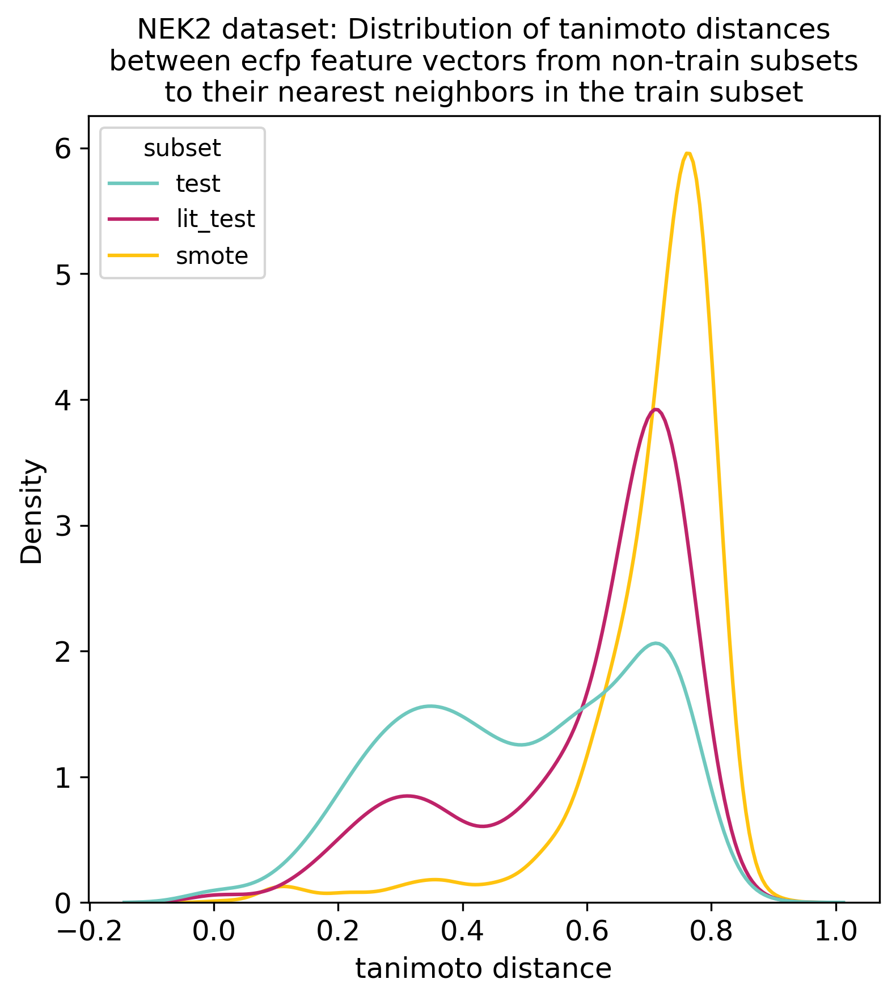

In [103]:
dists=plot_tani_dist_distr(nek2, 'base_rdkit_smiles', 'NEK2', radius=2, subsets=True, featurized=True)

In [136]:
smotes = nek2[nek2['subset']=='smote']
smotes

,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,ecfp2_1024_1014,ecfp2_1024_1015,ecfp2_1024_1016,ecfp2_1024_1017,ecfp2_1024_1018,ecfp2_1024_1019,ecfp2_1024_1020,ecfp2_1024_1021,ecfp2_1024_1022,ecfp2_1024_1023
1999,smote_0,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
2000,smote_1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
2001,smote_2,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
2002,smote_3,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
2003,smote_4,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3029,smote_1030,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3030,smote_1031,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
3031,smote_1032,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3032,smote_1033,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


In [105]:
nan_df = nek2.isna()
nek2[nan_df]

,compound_id,base_rdkit_smiles,active,ASA+_per_atom,ASA-,ASA_H_per_atom,ASA_P,ASA_per_atom,BCUT_PEOE_0,BCUT_PEOE_1,...,ecfp2_1024_1014,ecfp2_1024_1015,ecfp2_1024_1016,ecfp2_1024_1017,ecfp2_1024_1018,ecfp2_1024_1019,ecfp2_1024_1020,ecfp2_1024_1021,ecfp2_1024_1022,ecfp2_1024_1023
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3029,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


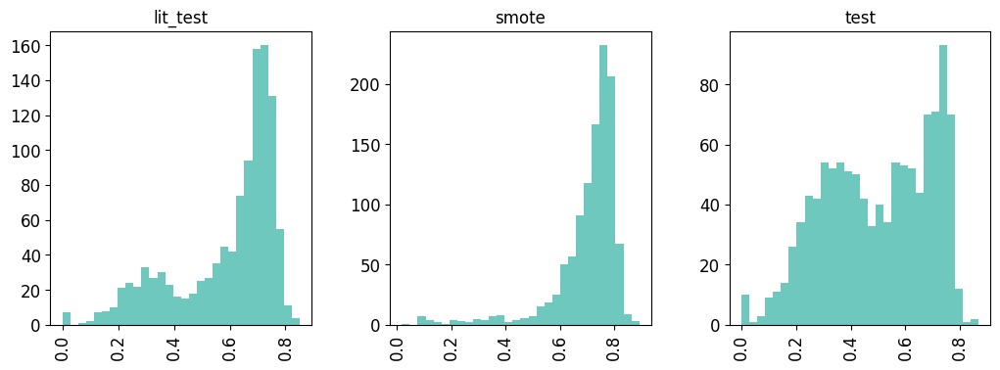

In [106]:
dists.hist(by='subset', bins=30, figsize=(12,4), layout=(1,3));

The SMOTE compounds are surprisingly diverse when I expected them to be closer to the training set. 

# Create correlation matrices of compounds

In [107]:
from scipy.spatial.distance import pdist, squareform

In [116]:
def plot_corr_matrices(dfs = [nek2, nek2[nek2.subset!='smote']], 
                    dflabs = ['NEK2 ECFP_1024', 'NEK2 MOE'],
                    firstcols = ["ecfp2_1024_0", "ASA+_per_atom"], 
                    lastcols = ["ecfp2_1024_1023", "zagreb_per_atom"], 
                    rowlabelcols = ['subset','subset'],
                    collabelcols=['active','active'],
                    dataset_names = ["all compounds", "non-SMOTE compounds"]):
    '''
    pass in a list of dataframes with associated labels, the columns to subset on for computing the UMAP, and which columns should reflect the labels and values
    computes umap and returns a strip of UMAP plots using each item in each list
    '''
    corr_dfs=[]
    for i, df in enumerate(dfs):
        print("Computing correlation matrix for", dflabs[i])
        df=df.set_index([rowlabelcols[i]])
        map_df = df.loc[:,firstcols[i]:lastcols[i]]
        corr_matrix = pd.DataFrame(squareform(pdist(map_df, metric='jaccard')), columns=map_df.index, index=map_df.index)
        lut = dict(zip(df.index.unique(), colors))
        lut2=dict(zip(df[collabelcols[i]].unique(), colors[-df[collabelcols[i]].nunique():]))
        row_colors = map_df.index.map(lut)
        col_colors = df[collabelcols[i]].map(lut2)
        g=sns.clustermap(corr_matrix, row_colors=row_colors, col_colors=col_colors)
        g.fig.suptitle(f"{dflabs[i]} correlation matrix of {dataset_names[i]}", y=1.02)
        corr_dfs.append(corr_matrix)
    return corr_dfs

In [117]:
nek2=pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')
nek2=nek2.sort_values('active')

/var/folders/wb/cvnnx9qn3tj18cq5_9wx39xm0000gn/T/ipykernel_87443/3923468785.py:1: DtypeWarning: Columns (1,309) have mixed types. Specify dtype option on import or set low_memory=False.
  nek2=pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')


Computing correlation matrix for NEK2 ECFP_1024


/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,
/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method

Computing correlation matrix for NEK2 MOE


/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,
/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/jayceepang/msse/capstone/atomsci/lib/python3.9/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method

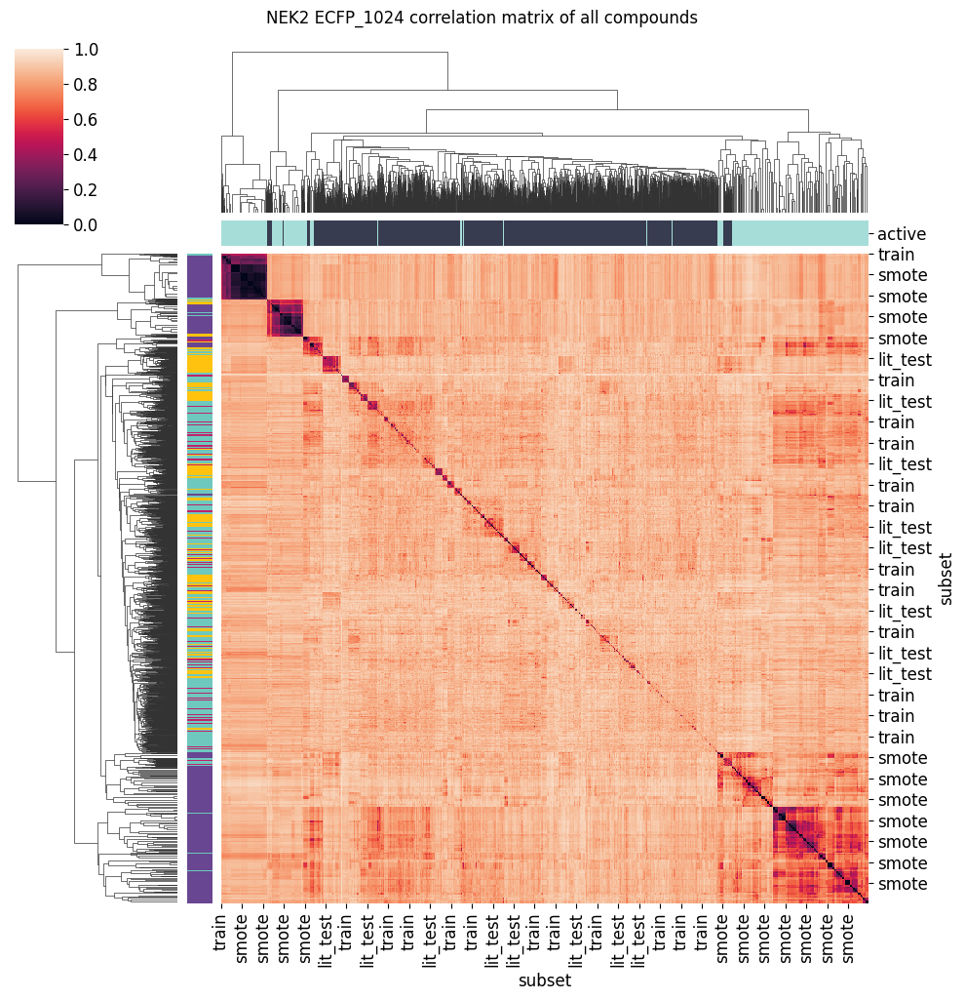

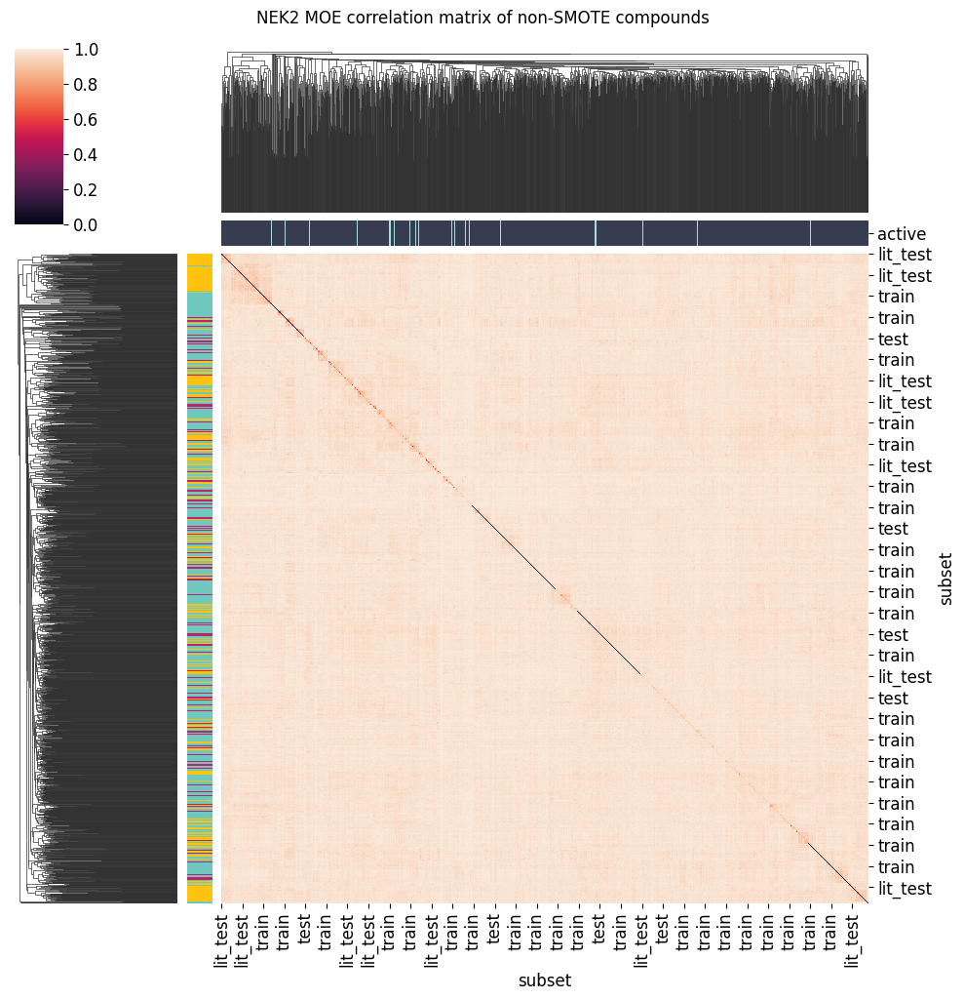

In [118]:
corr_dfs=plot_corr_matrices()

The correlation matrices show that the SMOTE compounds are more similar to each other than the training and test compounds, as they are clustered together in 2 large squares on the diagonal and then several smaller ones. The train, test and literature compounds show very little correlation, indicating a highly diverse dataset. For the most part they are also mixed together (row label colors) and don't show any strong clustering.

## Visualize the compound diversity using UMAP

In [83]:
from umap import UMAP
from sklearn.preprocessing import StandardScaler
import warnings

In [84]:
def run_feat_umap(plot_df, firstcol, lastcol, scale=True, scale_subsets=True, umap_subsets=False, subcol='subset', basesubs='train', random_state=42):
    '''
    given a single df of features, calculate UMAP projections and get coordinates back
    '''
    if scale and scale_subsets:
        map_df=plot_df.set_index(subcol)
        map_df = map_df.loc[:,firstcol:lastcol]
    else:
        map_df = plot_df.loc[:,firstcol:lastcol]
    shape1=map_df.shape
    map_df=map_df.dropna(how='any')
    if shape1!=map_df.shape:
        print(f"\tDropped {shape1[0]-map_df.shape[0]} rows with NaN values")
    if scale:
        if scale_subsets:
            scaler=StandardScaler().fit(map_df[map_df.index==basesubs])
        else:
            scaler=StandardScaler().fit(map_df)
        map_df=pd.DataFrame(scaler.transform(map_df), index=map_df.index, columns=map_df.columns)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=UserWarning)
        if umap_subsets:
            mapper=UMAP(n_neighbors=15, n_components=2, metric='jaccard', random_state=random_state).fit(map_df[map_df.index==basesubs])
        else:
            mapper=UMAP(n_neighbors=15, n_components=2, metric='jaccard', random_state=random_state).fit(map_df)

    map_df[['UMAP_X','UMAP_Y']]=mapper.transform(map_df)
    umap_coords=plot_df.join(map_df.reset_index()[['UMAP_X','UMAP_Y']])
    return umap_coords

In [85]:
def plot_feat_umaps(dfs = [nek2, nek2], 
                    dflabs = ['NEK2 ECFP_1024', 'NEK2 MOE'],
                    firstcols = ["ecfp2_1024_0", "ASA+_per_atom"], 
                    lastcols = ["ecfp2_1024_1023", "zagreb_per_atom"], 
                    dataset_names = ["all compounds", "non-SMOTE compounds"],
                    labelcols = ['subset','subset'],
                    scale=True,
                    scale_subsets = [True, True],
                    umap_subsets=[False,False],
                    subsetcols = ['subset','subset'],
                    basesubs = ['train', 'train'],
                    colorbars = [False, False], 
                    random_state=None):
    '''
    pass in a list of dataframes with associated labels, the columns to subset on for computing the UMAP, and which columns should reflect the labels and values
    computes umap and returns a strip of UMAP plots using each item in each list
    '''
    fig, ax = plt.subplots(1,len(dfs),figsize=(12*len(dfs),10),dpi=300)
    coord_dfs=[]
    for i in range(len(dfs)):
        print("Computing UMAP for", dflabs[i])
        umap_coords = run_feat_umap(plot_df=dfs[i], firstcol=firstcols[i], lastcol=lastcols[i], scale=scale, scale_subsets=scale_subsets[i], umap_subsets=umap_subsets[i], subcol=subsetcols[i], basesubs=basesubs[i], random_state=random_state)
        plot_df=umap_coords[umap_coords.UMAP_X.notna()]
        g=sns.scatterplot(plot_df, x="UMAP_X", y="UMAP_Y", s=15, hue=plot_df[labelcols[i]], ax=ax[i])
        ax[i].set_title(f"{dflabs[i]} UMAP of {dataset_names[i]}\nwith {labelcols[i]} labels")
        if colorbars[i]:
            fig.colorbar(im, ax=ax[i])
        coord_dfs.append(umap_coords)
    return coord_dfs

In [86]:
nek2=pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')
# instead of having a sorted dataset, shuffle the rows first
nek2=nek2.sample(frac=1).reset_index(drop=True)

/var/folders/wb/cvnnx9qn3tj18cq5_9wx39xm0000gn/T/ipykernel_87443/1311235615.py:1: DtypeWarning: Columns (1,309) have mixed types. Specify dtype option on import or set low_memory=False.
  nek2=pd.read_csv('NEK2_all_compounds_with_descriptors_and_ecfp_smote.csv')


Computing UMAP for NEK2 ECFP_1024
Computing UMAP for NEK2 MOE
	Dropped 1035 rows with NaN values


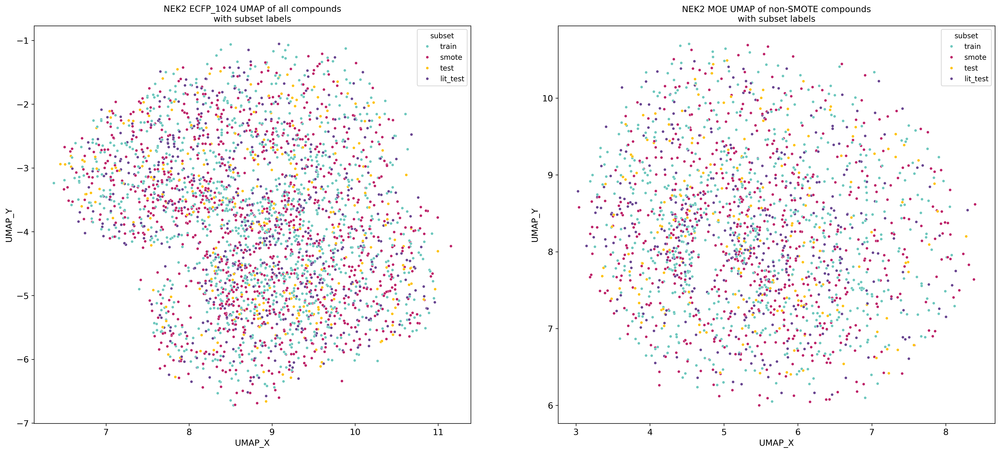

In [37]:
# scale_subsets controls whether the standard scaling is computed on the full dataset or only training data and then applied to other subsets
coord_dfs=plot_feat_umaps(scale_subsets=[True,True], umap_subsets=[False,False])

In both plots, we can see that the train and test compounds are well mixed, as expected from the random split we used. The literature compounds are somewhat mixed in but mostly separate from the training and test compounds; however they are still distributed across the UMAP space like the train and test sets and don't show much clumping or structure. The SMOTE compounds are again separate from the training and test compounds, and show some underlying structure/ clustering which could be due to the nature of how the data is created.

Computing UMAP for NEK2 ECFP_1024
Computing UMAP for NEK2 MOE
	Dropped 1035 rows with NaN values


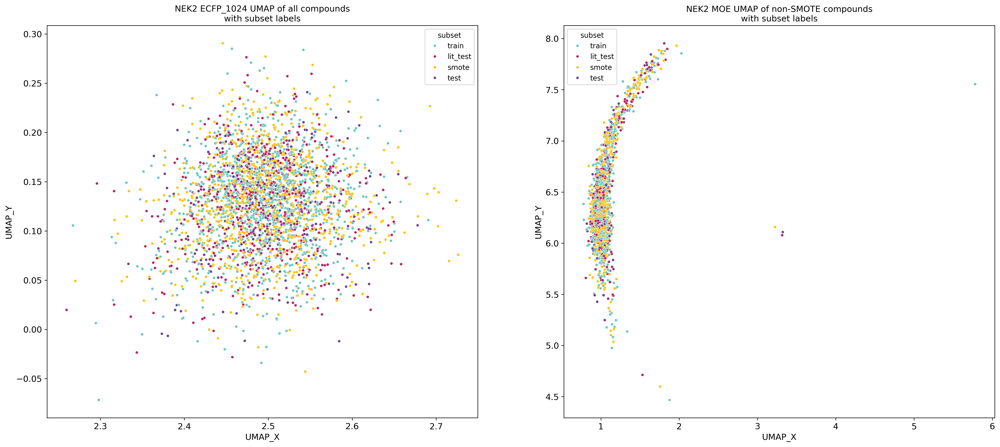

In [33]:
# umap_subsets controls whether the umap is fit on the full dataset or only training data and then applied to other subsets
# i think this limits the ability of the umap to represent differences in different subsets
coord_dfs=plot_feat_umaps(scale_subsets=[True,True], umap_subsets=[True,True])

When fitting the UMAP on the training set and then applying it to the other subsets, all the compounds are just piled on top of one another and it's hard to really compare if they are different or not. This is because the UMAP is fit on the training set and then applied to the other subsets, so the other subsets are not really represented in the UMAP space.

Computing UMAP for NEK2 ECFP_1024
Computing UMAP for NEK2 MOE
	Dropped 1035 rows with NaN values


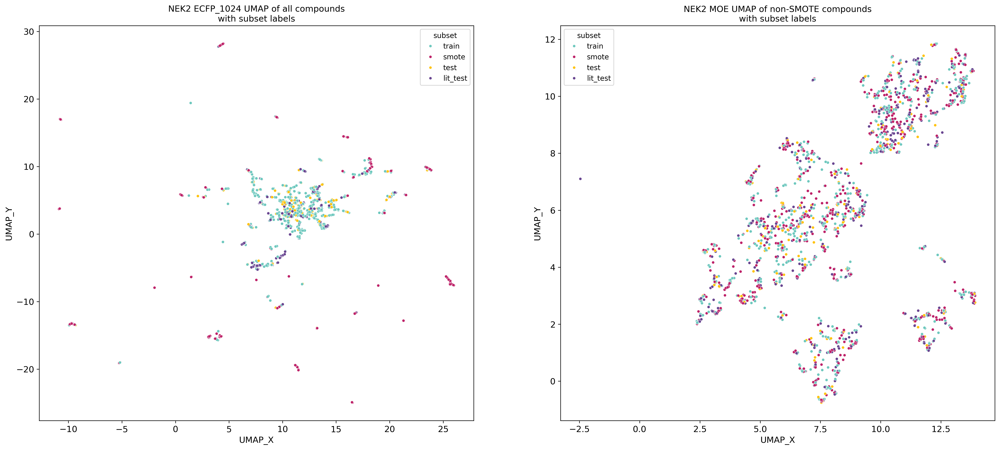

In [40]:
# you can also plot the raw data, but this isn't really valid on since each feature has a different scale and should be normalized
coord_dfs=plot_feat_umaps(scale=False, umap_subsets=[False,False])


When no scaling is applied to the input features, there are a lot of clusters that appear even though we know that the compounds are actually not that clustered and are well mixed. This is because the UMAP is trying to find structure in the data, and the different scales of the features are causing this structure to appear. This is why it is important to scale the features before applying UMAP.

Computing UMAP for NEK2 ECFP_1024
Computing UMAP for NEK2 MOE
	Dropped 1035 rows with NaN values


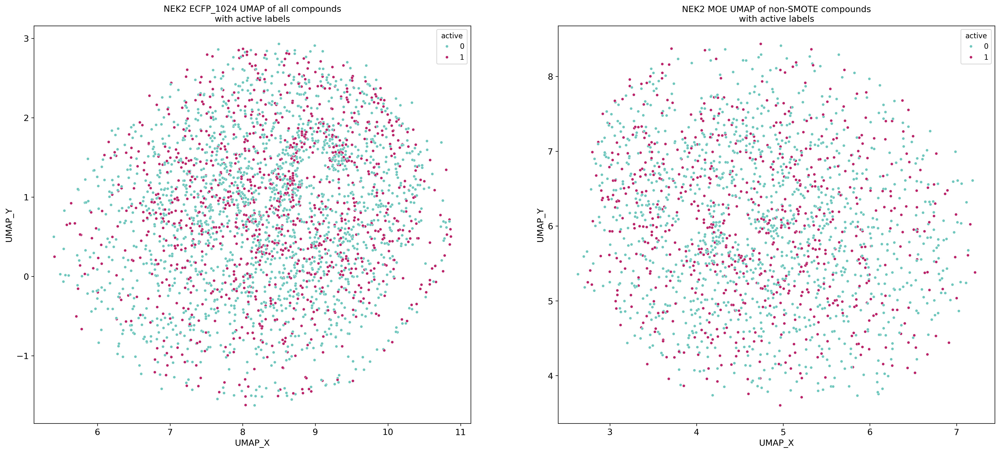

In [41]:
coord_dfs=plot_feat_umaps(scale_subsets=[True,True], umap_subsets=[False,False], labelcols=['active','active'])


# Use our own datasets

In [87]:
datapath = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/'

In [89]:
nek2moesmote = pd.read_csv(f'{datapath}NEK2/bind/NEK2_binding_moe_SMOTE_df.csv') 
nek2mfpsmote = pd.read_csv(f'{datapath}NEK2/bind/NEK2_binding_mfp_SMOTE_df.csv') 

In [42]:
nek2moesmote = pd.read_csv(f'{datapath}NEK2/bind/NEK2_binding_moe_SMOTE_df.csv') 
nek2_desc = pd.read_csv(f'{datapath}NEK2/bind/NEK2_binding_moe_scaled_df.csv') 
nek2_mfp = pd.read_csv(f'{datapath}NEK2/bind/NEK2_binding_mfp_scaled_df.csv') 
nek2mfpsmote = pd.read_csv(f'{datapath}NEK2/bind/NEK2_binding_mfp_SMOTE_df.csv') 
mfp_dict = {}
for i in range (2048): 
    mfp_dict[str(i)] = f'ecfp_2048_{i}'
# mfp_dict = {str(i): f'mfp_2048_{i}' for i in range(2048)}
nek2mfpsmote = nek2mfpsmote.rename(columns=mfp_dict)
nek2_mfp = nek2_mfp.rename(columns=mfp_dict)



nek2_binding = nek2_desc.join(nek2_mfp, lsuffix='_moe', rsuffix='_mfp')
nek2_binding


moe_cols = [col for col in nek2_binding.columns if '_moe' in col]
mfp_cols = [col.replace('_moe', '_mfp') for col in moe_cols]
for moe_col, mfp_col in zip(moe_cols, mfp_cols):
    if mfp_col in nek2_binding.columns:  
        if not nek2_binding[moe_col].equals(nek2_binding[mfp_col]):
            print(f'different for {moe_col} and {mfp_col}')

nek2_binding = nek2_binding.drop(columns=mfp_cols)
nek2_binding.columns = nek2_binding.columns.str.replace('_moe', '')

nek2_binding_smote = nek2moesmote.join(nek2mfpsmote, lsuffix='_moe', rsuffix='_mfp')


moe_cols = [col for col in nek2_binding_smote.columns if '_moe' in col]
mfp_cols = [col.replace('_moe', '_mfp') for col in moe_cols]
for moe_col, mfp_col in zip(moe_cols, mfp_cols):
    if mfp_col in nek2_binding_smote.columns:  
        if not nek2_binding_smote[moe_col].equals(nek2_binding_smote[mfp_col]):
            print(f'different for {moe_col} and {mfp_col}')

nek2_binding_smote = nek2_binding_smote.drop(columns=mfp_cols)
nek2_binding_smote.columns = nek2_binding_smote.columns.str.replace('_moe', '')
# nek2_binding_smote['compound_id']=[f'smote_{x}' for x in range(len(nek2_binding_smote))]
nek2_binding_smote = nek2_binding_smote[nek2_binding_smote['subset'] != 'test']
print(f'final shape after join and remove test: {nek2_binding_smote.shape}')

nek2_binding_smote = nek2_binding_smote[nek2_binding_smote['subset'] == 'train']
nek2_binding_smote['subset'] = 'SMOTE'
nek2_binding_all = pd.concat([nek2_binding, nek2_binding_smote])
print(f'nonsmote and smote: {nek2_binding_all.shape}')

print(nek2_binding_all['subset'].value_counts())


final shape after join and remove test: (2160, 2359)
nonsmote and smote: (3568, 2359)
subset
SMOTE    2160
train    1125
test      283
Name: count, dtype: int64


In [46]:
nek2_binding_all['base_rdkit_smiles']

0                                       Cn1cnc2c(N)ncnc21
1       CNCc1ccc(-c2cc(-c3nc(-c4ccc(S(=O)(=O)C(C)C)cc4...
2       CNC(=O)Nc1ccc2c(c1)CC[C@@]21OC(=O)N(CC(=O)N(Cc...
3       CC(=O)Nc1ccc2ccn(-c3cc(NC4CC4)n4ncc(C#N)c4n3)c2c1
4                   Cc1cccc(-c2nc(Nc3ccncc3)c3ccccc3n2)n1
                              ...                        
2155                                      synthetic SMOTE
2156                                      synthetic SMOTE
2157                                      synthetic SMOTE
2158                                      synthetic SMOTE
2159                                      synthetic SMOTE
Name: base_rdkit_smiles, Length: 3568, dtype: object

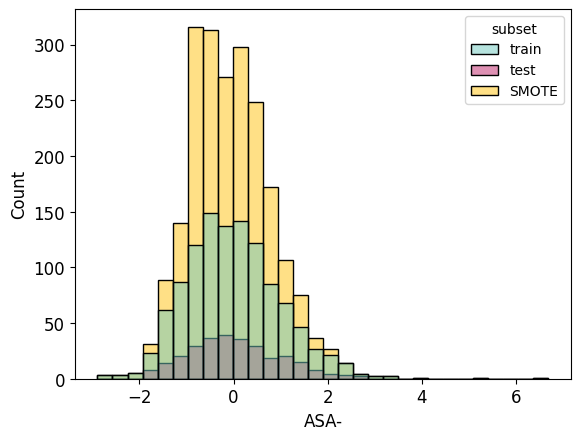

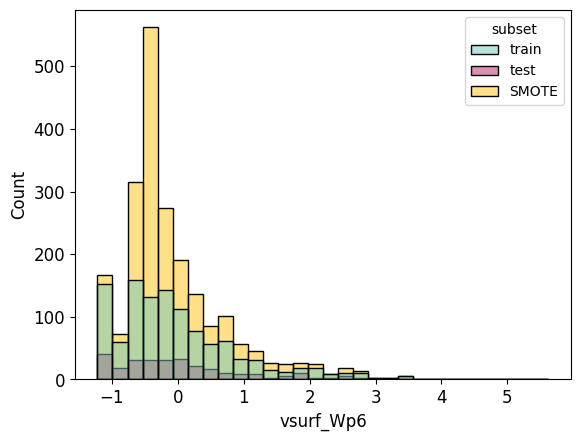

In [135]:
sns.histplot(nek2_binding_all, x='ASA-', hue='subset', bins=30)
plt.show();
sns.histplot(nek2_binding_all, x='vsurf_Wp6', hue='subset', bins=30)
plt.show();


In [47]:
# nek2_og = nek2_binding_all[nek2_binding_all['base_rdkit_smiles']!='synthetic SMOTE']
dists=dp.plot_tani_dist_distr(nek2_binding_all, 'base_rdkit_smiles', 'NEK2_binding', radius=2, subsets=True)
# dists=dp.plot_tani_dist_distr(nek2_og, 'base_rdkit_smiles', 'NEK2_binding', radius=2, subsets=True)

/Users/jayceepang/msse/capstone/repos/AMPL/atomsci/ddm/pipeline/diversity_plots.py:152: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dists=pd.concat([dists,diststmp])


ArgumentError: Python argument types in
    rdkit.Chem.rdMolDescriptors.GetMorganFingerprintAsBitVect(NoneType, int, int)
did not match C++ signature:
    GetMorganFingerprintAsBitVect(RDKit::ROMol mol, unsigned int radius, unsigned int nBits=2048, boost::python::api::object invariants=[], boost::python::api::object fromAtoms=[], bool useChirality=False, bool useBondTypes=True, bool useFeatures=False, boost::python::api::object bitInfo=None, bool includeRedundantEnvironments=False)

In [55]:
from rdkit import Chem
from rdkit.Chem import AllChem
invalid_smiles = nek2_binding_all['base_rdkit_smiles'].apply(lambda x: Chem.MolFromSmiles(x) is None)
nek2_binding_all[invalid_smiles]['base_rdkit_smiles']


0       synthetic SMOTE
1       synthetic SMOTE
2       synthetic SMOTE
3       synthetic SMOTE
4       synthetic SMOTE
             ...       
2155    synthetic SMOTE
2156    synthetic SMOTE
2157    synthetic SMOTE
2158    synthetic SMOTE
2159    synthetic SMOTE
Name: base_rdkit_smiles, Length: 2160, dtype: object